In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from wordcloud import WordCloud
import missingno as msno

In [2]:
OTT = pd.read_csv('./Downloads/netflix_titles.csv/netflix_titles.csv')

In [3]:
OTT

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...
...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,"November 20, 2019",2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a..."
8803,s8804,TV Show,Zombie Dumb,NaN,NaN,NaN,"July 1, 2019",2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies","While living alone in a spooky town, a young g..."
8804,s8805,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,"November 1, 2019",2009,R,88 min,"Comedies, Horror Movies",Looking to survive in a world taken over by zo...
8805,s8806,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,"January 11, 2020",2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero..."


# Checking the columns 

In [4]:
OTT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [5]:
OTT.nunique()

show_id         8807
type               2
title           8807
director        4528
cast            7692
country          748
date_added      1767
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

<Axes: >

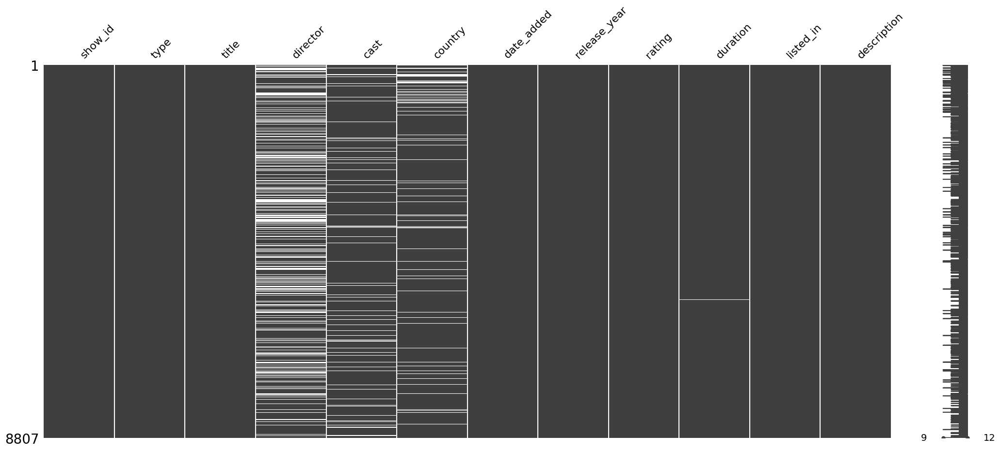

In [6]:
msno.matrix(OTT)

# Data cleaning

Dropping the Direcotr and cast columns

In [7]:
OTT.drop(['director', 'cast'], axis= 1, inplace= True)

In [8]:
OTT.dropna(subset=['date_added'], inplace=True)

In [9]:
OTT.isna().sum()

show_id           0
type              0
title             0
country         830
date_added        0
release_year      0
rating            4
duration          3
listed_in         0
description       0
dtype: int64

Covrting the date_added column to datetype data type
and also adding new columns year and month based on that

In [10]:
OTT['date'] = pd.to_datetime(OTT.date_added, format='mixed', errors='coerce')
OTT['year'] = pd.DatetimeIndex(OTT.date).year
OTT['month'] = pd.DatetimeIndex(OTT.date).month

In [11]:
OTT[['year', 'month']]

,year,month
0,2021,9
1,2021,9
2,2021,9
3,2021,9
4,2021,9
...,...,...
8802,2019,11
8803,2019,7
8804,2019,11
8805,2020,1


Adding the age groups based on Rating of the TV shows and movies

In [12]:
rating_age_groups = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

OTT['age_groups'] = OTT['rating'].replace(rating_age_groups)


In [13]:
'''so there are some values such as 74 min, 84 min, and 66 min in the rating column 
    so We have to remove that from that column'''

to_remove_rating = ['74 min', '84 min', '66 min']
OTT = OTT[~OTT['rating'].isin(to_remove_rating)]

In [14]:
OTT.head()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,date,year,month,age_groups
0,s1,Movie,Dick Johnson Is Dead,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021-09-25,2021,9,Teens
1,s2,TV Show,Blood & Water,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021-09-24,2021,9,Adults
2,s3,TV Show,Ganglands,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,2021-09-24,2021,9,Adults
3,s4,TV Show,Jailbirds New Orleans,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",2021-09-24,2021,9,Adults
4,s5,TV Show,Kota Factory,India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021-09-24,2021,9,Adults


In [15]:
OTT['country'].fillna('Unknown', inplace=True)

In [16]:
OTT['country'].value_counts()

country
United States                             2809
India                                      972
Unknown                                    830
United Kingdom                             418
Japan                                      244
                                          ... 
Romania, Bulgaria, Hungary                   1
Uruguay, Guatemala                           1
France, Senegal, Belgium                     1
Mexico, United States, Spain, Colombia       1
United Arab Emirates, Jordan                 1
Name: count, Length: 749, dtype: int64

In [17]:
OTT[OTT['country'] == 'Romania, Bulgaria, Hungary']

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,date,year,month,age_groups
3203,s3204,Movie,Why Me?,"Romania, Bulgaria, Hungary","December 1, 2019",2015,TV-MA,126 min,"Dramas, International Movies, Thrillers",A young prosecutor is assigned a career-making...,2019-12-01,2019,12,Adults


In [18]:
#counting the first country
OTT['country'] = OTT['country'].apply(lambda x : x.split(",")[0])
OTT['country'].value_counts()

country
United States     3202
India             1008
Unknown            830
United Kingdom     627
Canada             271
                  ... 
Namibia              1
Senegal              1
Luxembourg           1
Syria                1
Somalia              1
Name: count, Length: 87, dtype: int64

In [19]:
OTT.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8794 entries, 0 to 8806
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       8794 non-null   object        
 1   type          8794 non-null   object        
 2   title         8794 non-null   object        
 3   country       8794 non-null   object        
 4   date_added    8794 non-null   object        
 5   release_year  8794 non-null   int64         
 6   rating        8790 non-null   object        
 7   duration      8794 non-null   object        
 8   listed_in     8794 non-null   object        
 9   description   8794 non-null   object        
 10  date          8794 non-null   datetime64[ns]
 11  year          8794 non-null   int32         
 12  month         8794 non-null   int32         
 13  age_groups    8790 non-null   object        
dtypes: datetime64[ns](1), int32(2), int64(1), object(10)
memory usage: 961.8+ KB


In [20]:
OTT.isna().sum()

show_id         0
type            0
title           0
country         0
date_added      0
release_year    0
rating          4
duration        0
listed_in       0
description     0
date            0
year            0
month           0
age_groups      4
dtype: int64

Now that we have only four NaN values we can drop those rows as it won't affect the whole dataset

In [21]:
OTT.dropna()

,show_id,type,title,country,date_added,release_year,rating,duration,listed_in,description,date,year,month,age_groups
0,s1,Movie,Dick Johnson Is Dead,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021-09-25,2021,9,Teens
1,s2,TV Show,Blood & Water,South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021-09-24,2021,9,Adults
2,s3,TV Show,Ganglands,Unknown,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,2021-09-24,2021,9,Adults
3,s4,TV Show,Jailbirds New Orleans,Unknown,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",2021-09-24,2021,9,Adults
4,s5,TV Show,Kota Factory,India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021-09-24,2021,9,Adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,United States,"November 20, 2019",2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a...",2019-11-20,2019,11,Adults
8803,s8804,TV Show,Zombie Dumb,Unknown,"July 1, 2019",2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies","While living alone in a spooky town, a young g...",2019-07-01,2019,7,Older Kids
8804,s8805,Movie,Zombieland,United States,"November 1, 2019",2009,R,88 min,"Comedies, Horror Movies",Looking to survive in a world taken over by zo...,2019-11-01,2019,11,Adults
8805,s8806,Movie,Zoom,United States,"January 11, 2020",2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero...",2020-01-11,2020,1,Older Kids


In [22]:
OTT['year'] = OTT['year'].astype('int64')
OTT['month'] = OTT['month'].astype('int64')

In [23]:
OTT.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8794 entries, 0 to 8806
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       8794 non-null   object        
 1   type          8794 non-null   object        
 2   title         8794 non-null   object        
 3   country       8794 non-null   object        
 4   date_added    8794 non-null   object        
 5   release_year  8794 non-null   int64         
 6   rating        8790 non-null   object        
 7   duration      8794 non-null   object        
 8   listed_in     8794 non-null   object        
 9   description   8794 non-null   object        
 10  date          8794 non-null   datetime64[ns]
 11  year          8794 non-null   int64         
 12  month         8794 non-null   int64         
 13  age_groups    8790 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 1.0+ MB


In [24]:
OTT_movies = OTT[OTT['type'] == 'Movie']

In [25]:
OTT_TVShows = OTT[OTT['type'] == 'TV Show']

In [26]:
years = np.arange(2016, 2022)
OTT = OTT[OTT['year'].isin(years)]

# Exploratory Data Analysis

In [27]:
fig = px.histogram(data_frame=OTT, x= 'type', color = 'type', template ='plotly_dark',
                  color_discrete_sequence=['#E50914','#F5F5F1'],
                  text_auto=True, barmode='stack')
fig.update_traces(textfont_size = 20, textangle = 0, textposition ='outside', marker_line_color = '#221F1F',
                 marker_line_width = 3.5, cliponaxis = False)
fig.show()

# Age Group Analysis

## Age group countplot

In [28]:
fig = px.histogram(data_frame=OTT, x= 'age_groups', color = 'age_groups', template ='plotly_dark',
                  color_discrete_sequence=['#E50914','#F5F5F1'],
                  text_auto=True, barmode='stack')
fig.update_traces(textfont_size = 25, textangle = 0, textposition ='outside', marker_line_color = '#221F1F',
                 marker_line_width = 3.5, cliponaxis = False)
fig.show()

## Age group sunbrust

In [29]:
age_df = OTT.groupby(['type', 'age_groups']).size().reset_index().rename(columns= {0: 'count'})

fig = px.sunburst(age_df, values = 'count', path = ['type', 'age_groups'], 
                  template = 'plotly_dark')
fig.update_traces(textinfo = 'label+ percent parent')
fig.show()

1. 70 % movie are there
2. for kids there only 5% of movies and 10 % tv shows

# Year Analysis

### Year Countplot

In [30]:
fig = px.histogram(data_frame=OTT, x= 'year', color = 'year', template ='plotly_dark',
                  color_discrete_sequence=['#E50914','#F5F5F1'],
                  text_auto=True, barmode='stack')
fig.update_traces(textfont_size = 25, textangle = 0, textposition ='outside', marker_line_color = '#221F1F',
                 marker_line_width = 3.5, cliponaxis = False)
fig.show()

In [31]:
# counts of movies and tv shows with each age-groups and also count of age groups
fig = px.histogram(data_frame=OTT, x= ['age_groups','type'], color = 'age_groups', template ='plotly_dark',
                  color_discrete_sequence=['#E50914','#F5F5F1'],
                  text_auto=True, barmode='stack')
fig.update_traces(textfont_size = 25, textangle = 0, textposition ='outside', marker_line_color = '#221F1F',
                 marker_line_width = 3.5, cliponaxis = False)
fig.show()

# Year, Age, and Type Treemap

In [32]:
year_df = OTT.groupby(['year', 'age_groups', 'type']).size().reset_index().rename(columns = { 0: 'count'})

fig = px.treemap(year_df, values ='count', path= ['year', 'type', 'age_groups'], template = 'plotly_dark')
fig.update_traces(textinfo= 'label + percent parent')
fig.show()

1. from 2016 to 2922 mostly adult movies and TV shows were released
2. almost (1/3)rd of the teens movies and TV shows were released
3. from 2016 to 2022 TV shows were increaseingly being released

# Countrywise analysis

## Top 10 Countries plot

In [33]:
country_dict = {
    'Country': OTT.groupby('country').size().sort_values(ascending=False)[:10].index,
    'Number of Movies/ TV shows': OTT.groupby('country').size().sort_values(ascending=False)[:10].values
}

top_10_countries = pd.DataFrame(data = country_dict, columns = ['Country', 'Number of Movies/ TV shows'])

fig = px.bar(top_10_countries, x= 'Country', y= 'Number of Movies/ TV shows',
            color = 'Number of Movies/ TV shows',
            text_auto = True, 
            color_continuous_scale=[(0, "#F5F5F1"), (1, "#E50914")],
            template='plotly_dark'
            )
fig.show()

# World map Plot

In [34]:
country_df = OTT.groupby('country').size().reset_index().rename(columns={ 0 : 'count'})

fig = px.choropleth(country_df,
                   locations='country',
                   locationmode = 'country names',
                   range_color = [0,3100],
                   color = 'count',
                   color_continuous_scale=[(0, "#F5F5F1"), (1, "#E50914")],
                   template='plotly_dark' )
fig.update_layout(title = 'Content by Countires')

fig.show()

In [35]:
OTT_country = pd.DataFrame(data= OTT.groupby('country').size().reset_index().rename(columns = {0:'count'}))

In [36]:
OTT_country.sort_values(['count'], ascending=False)

,country,count
80,United States,3100
30,India,1008
81,Unknown,827
79,United Kingdom,620
11,Canada,264
...,...,...
47,Namibia,1
53,Paraguay,1
66,Somalia,1
65,Slovenia,1


1. In USA total 3100 movies and TV shows were released.
2. more than 800 locations are Unknown.

# Movie Duration Analysis

In [37]:
OTT_movies['duration']= OTT_movies['duration'].str.replace(' min', '').astype('int')

In [38]:
fig = px.histogram(OTT_movies, x= 'duration', marginal ='rug',
                  hover_data = ['duration', 'title','country',
                                'date_added','age_groups', 'listed_in','description'],
                  color_discrete_sequence=['red'],
                  template='plotly_dark')
fig.show()

Most of the movies are 90 - 110 min long

## Duration vs Age Boxplot

In [39]:
fig = px.box(OTT_movies, x = 'duration', y= 'age_groups',
            color= 'age_groups', notched = True,
            template='plotly_dark')
fig.show()

# WordCloud

## Movies Wordcloud

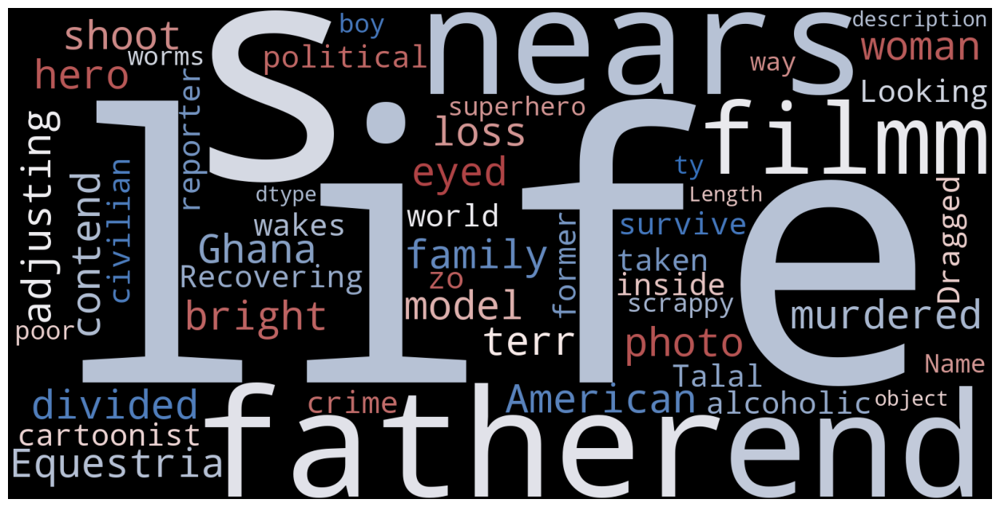

In [40]:
text = str(OTT_movies['description'])

plt.rcParams['figure.figsize'] = (16,8)
wc = WordCloud(background_color = 'black',
                     colormap = 'vlag', width = 1600,
                     height = 800, max_words = 121).generate(text)

plt.imshow(wc)
plt.axis('off')
plt.show()

## TV shows Wordcloud

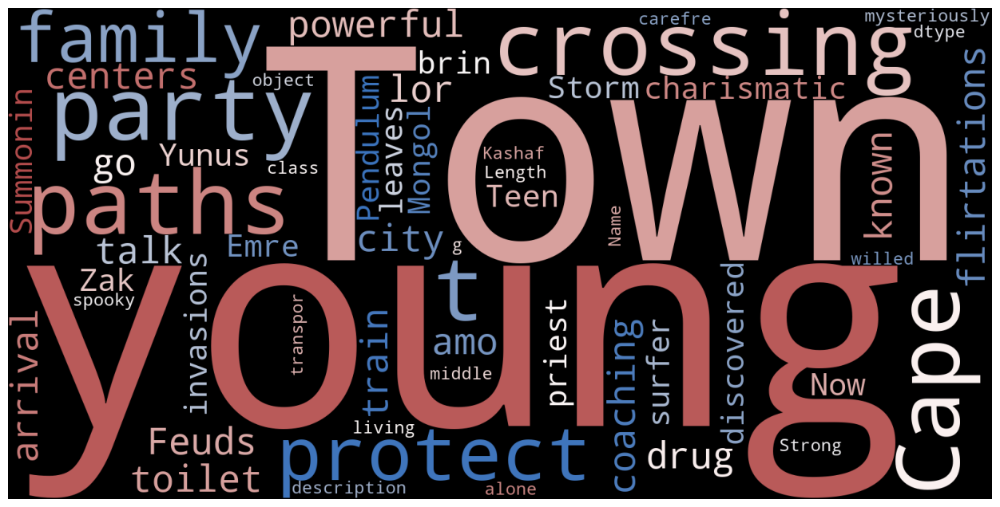

In [41]:
text = str(OTT_TVShows['description'])

plt.rcParams['figure.figsize'] = (16,8)
wc = WordCloud(background_color = 'black',
                     colormap = 'vlag', width = 1600,
                     height = 800, max_words = 121).generate(text)

plt.imshow(wc)
plt.axis('off')
plt.show()